## Analysis

In [1]:
import pandas as pd
from ast import literal_eval
import seaborn as sns
import matplotlib as plt
import re

In [2]:
df = pd.read_csv('data_v1/wiki-dataset-results-1k.csv')

In [3]:
# all columns with objects stored as strings have to be evaluated back to objects
objectTypeCols = [
    'sentences',
    'paraphrased_sentences',
    'normal_entities',
    'paraphrased_entities',
    'normal_predictions',
    'paraphrased_predictions',
    'normal_prediction_tokens',
    'paraphrased_prediction_tokens'
    ]

for col in objectTypeCols:
    df[col] = df[col].apply(lambda cell: literal_eval(cell))

In [4]:
# convert numpy number types to native python for processing
# with autoviz
df['normal_scores'] = df['normal_scores'].apply(lambda cell: int(cell))
df['paraphrased_scores'] = df['paraphrased_scores'].apply(lambda cell: int(cell)) #.item())

In [5]:
df.shape

(944, 18)

In [6]:
# text lengths after preprocessing
df['normal_text_length'] = df['normal_text'].apply(lambda text: len(text))
df['paraphrased_text_length'] = df['paraphrased_text'].apply(lambda text: len(text))

In [7]:
# number of sentences in each wiki page after preprocessing
# sentences were used for paraphrasing. Later joined back together for NER and fill-mask
df['normal_sentences_count'] = df['sentences'].apply(lambda array: len(array))
df['paraphrased_sentences_count'] = df['paraphrased_sentences'].apply(lambda array: len(array))

In [8]:
# number of masks present in text ready for processing
df['normal_mask_count'] = df['normal_masked_text'].apply(lambda text: len([*re.finditer('<mask>', text)]))
df['paraphrased_mask_count'] = df['paraphrased_masked_text'].apply(lambda text: len([*re.finditer('<mask>', text)]))

In [9]:
# count of entities detected by NER, where masking can be applied (entities which
# are not the person the wiki page is about are filtered out)
df['normal_entities_count'] = df['normal_entities'].apply(lambda arr: len(arr))
df['paraphrased_entities_count'] = df['paraphrased_entities'].apply(lambda arr: len(arr))

In [10]:
# top 20 scorer numbers of different metrics compared by paraphrased or not
# TODO

In [11]:
# worst 20 scorer numbers of different metrics compared by paraphrased or not
# TODO

In [12]:
# compare average of trimmed characters by paraphrasing
# TODO

## analysis of average scorings

In [21]:
# average numbers of different metrics compared by paraphrased or not
# CAREFUL: this excludes examples which were lost during computation (due to NER not detecting any entities)
print("NORMAL Average masks count per page: {}".format(round(df['normal_entities_count'].mean(),2)))
print("PARAPH Average masks count per page: {}".format(round(df['paraphrased_entities_count'].mean(),2)))
print("")
print("NORMAL Average score per page: {}".format(round(df['normal_scores'].mean(),2)))
print("PARAPH Average score per page: {}".format(round(df['paraphrased_scores'].mean(),2)))
print("")
print("NORMAL Average text length: {}".format(round(df['normal_text_length'].mean(),2)))
print("PARAPH Average text length: {}".format(round(df['paraphrased_text_length'].mean(),2)))

NORMAL Average masks count per page: 6.37
PARAPH Average masks count per page: 5.27

NORMAL Average score per page: 17.62
PARAPH Average score per page: 15.42

NORMAL Average text length: 3451.22
PARAPH Average text length: 2345.54


## analysis of bad scores
- N: normal
- P: paraphrased

In [14]:
# how many rows did not have any masks to predict and therefore no predictions?
Nzero = len(df.loc[df['normal_entities_count'] == 0])
Pzero = len(df.loc[df['paraphrased_entities_count'] == 0])

print("NORMAL {}/{} ({}%) did not have any masks to predict".format(Nzero, df.shape[0], round(100 / df.shape[0] * Nzero,2)))
print("PARAPH {}/{} ({}%) did not have any masks to predict".format(Pzero, df.shape[0], round(100 / df.shape[0] * Pzero,2)))

NORMAL 16/944 (1.69%) did not have any masks to predict
PARAPH 50/944 (5.3%) did not have any masks to predict


In [15]:
# how many rows did not correctly predict any mask at all? (without those that had no masks to predict)
NzeroPredictedEntitiesRows = df.loc[(df['normal_scores'] == 0) & (df['normal_entities_count'] > 0)]
PzeroPredictedEntitiesRows = df.loc[(df['paraphrased_scores'] == 0) & (df['normal_entities_count'] > 0)]
NCount = len(NzeroPredictedEntitiesRows)
PCount = len(PzeroPredictedEntitiesRows)
Npercent = round(100 / df.shape[0] * NCount, 2)
Ppercent = round(100 / df.shape[0] * PCount, 2)
print("NORMAL No mask correctly predicted for {}/{} pages ({}%)".format(NCount, df.shape[0], Npercent))
print("PARAPH No mask correctly predicted for {}/{} pages ({}%)".format(PCount, df.shape[0], Ppercent))

NORMAL No mask correctly predicted for 369/944 pages (39.09%)
PARAPH No mask correctly predicted for 524/944 pages (55.51%)


In [16]:
# what was the average text length for those which did not contain a single entity?
NzeroPredictedEntitiesRows = df.loc[(df['normal_scores'] == 0) & (df['normal_entities_count'] > 0)]
PzeroPredictedEntitiesRows = df.loc[(df['paraphrased_scores'] == 0) & (df['normal_entities_count'] > 0)]
print("NORMAL average text length for 0 score: {} chars".format(round(NzeroPredictedEntitiesRows['normal_text_length'].mean(),2)))
print("PARAPH average text length for 0 score: {} chars".format(round(PzeroPredictedEntitiesRows['normal_text_length'].mean(),2)))

NORMAL average text length for 0 score: 3251.49 chars
PARAPH average text length for 0 score: 3349.48 chars


## Basic graphs

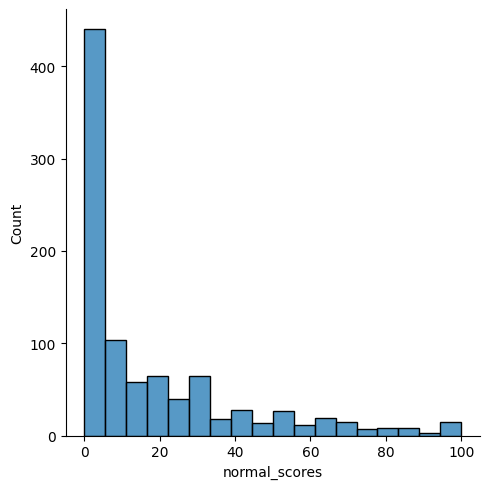

In [17]:
# number of pages with % score with normal text
sns.displot(df.normal_scores)

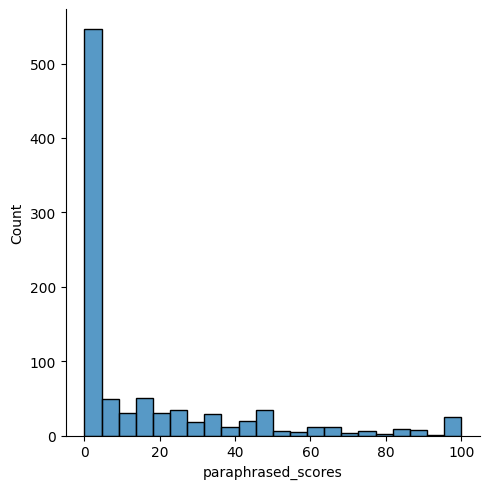

In [18]:
# number of pages with % score when examples were paraphrased
sns.displot(df.paraphrased_scores)

## metric flooding
Compare all and any variable in the dataset to get a quick overview on which results might be interesting to compare or look at in more detail. Results are stored separately, commented and easier to read than within the notebook.

In [19]:
%matplotlib inline
from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()

Imported v0.1.55. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


Shape of your Data Set loaded: (944, 26)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  10
    Number of String-Categorical Columns =  6
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  6
    Number of Date Time Columns =  0
    Number of ID Columns =  4
    Number of Columns to Delete =  0
    26 Predictors classified...
        4 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 55


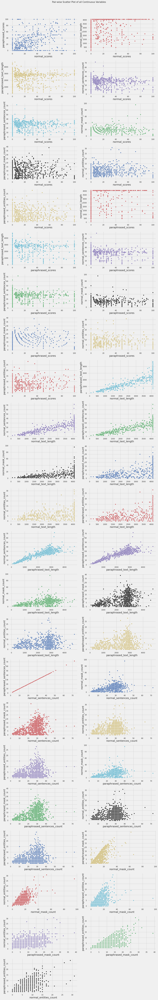

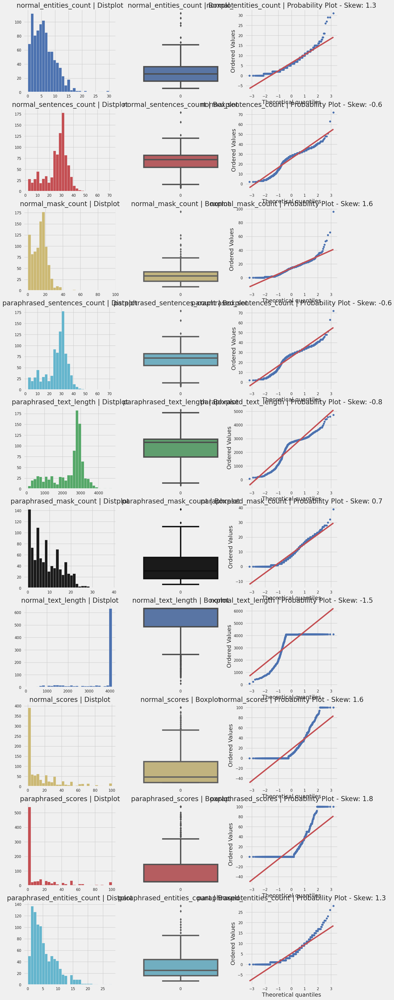

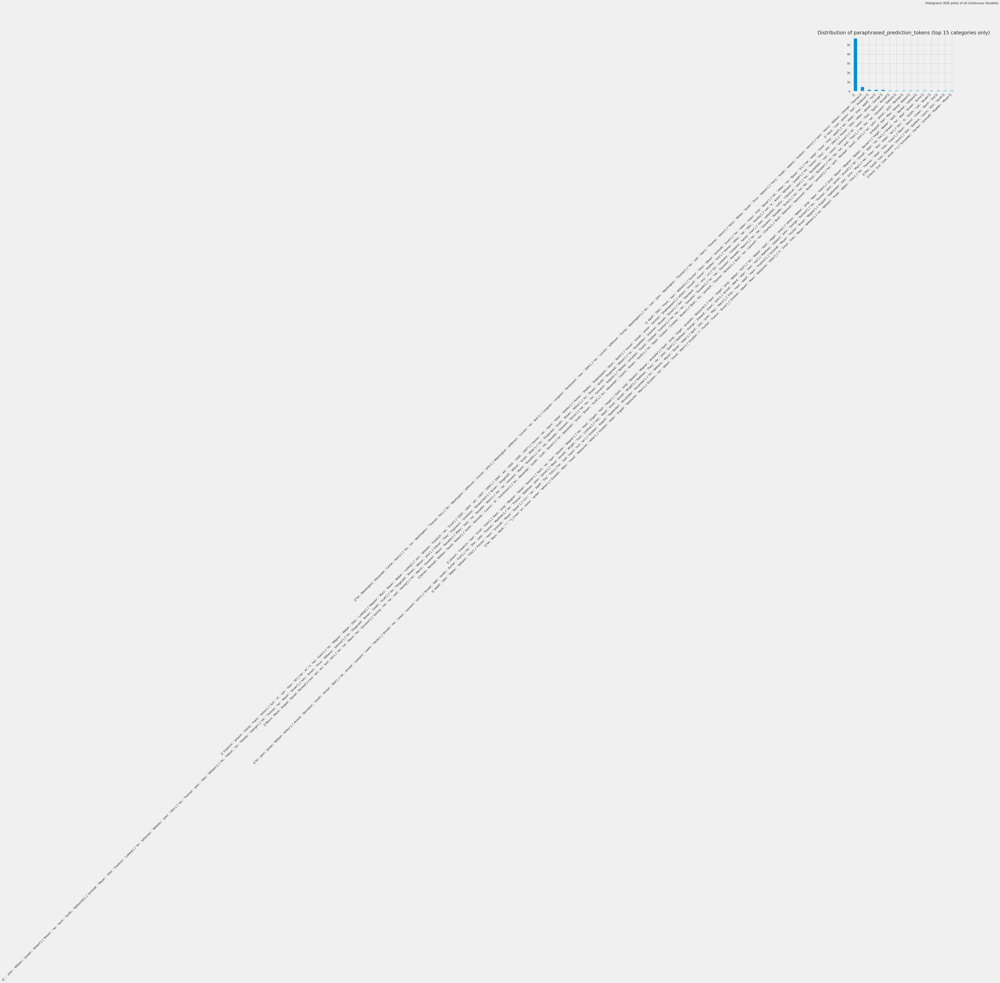

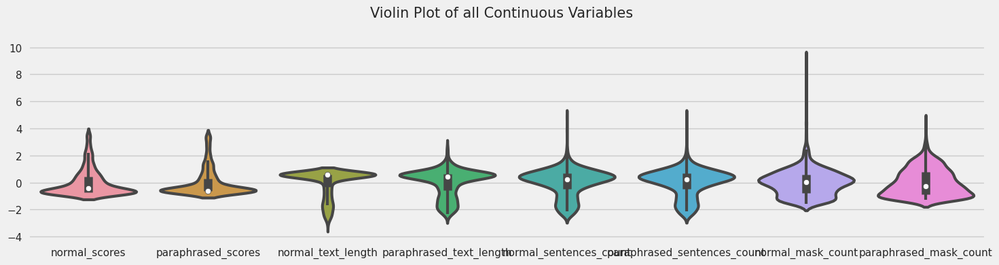

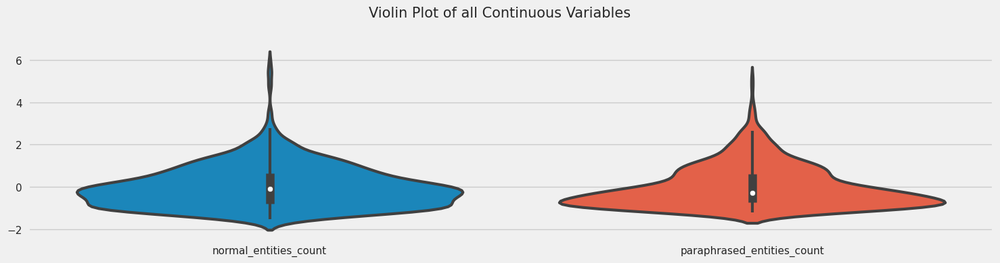

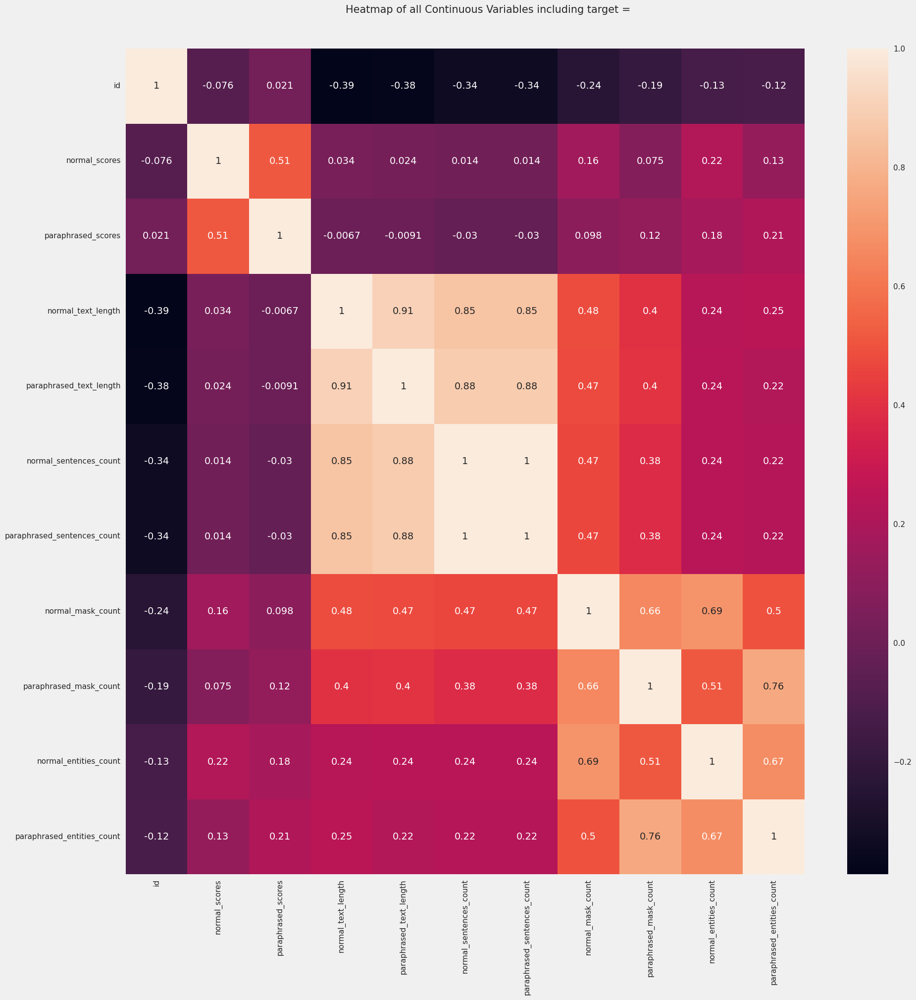

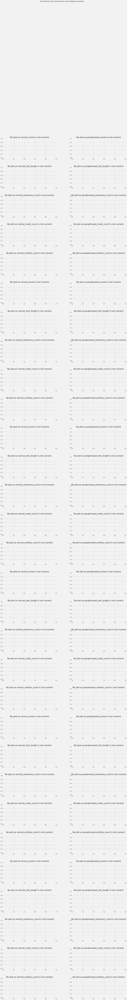

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /home/nya/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /home/nya/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /home/nya/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /home/nya/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /home/nya/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /home/nya/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /home/n

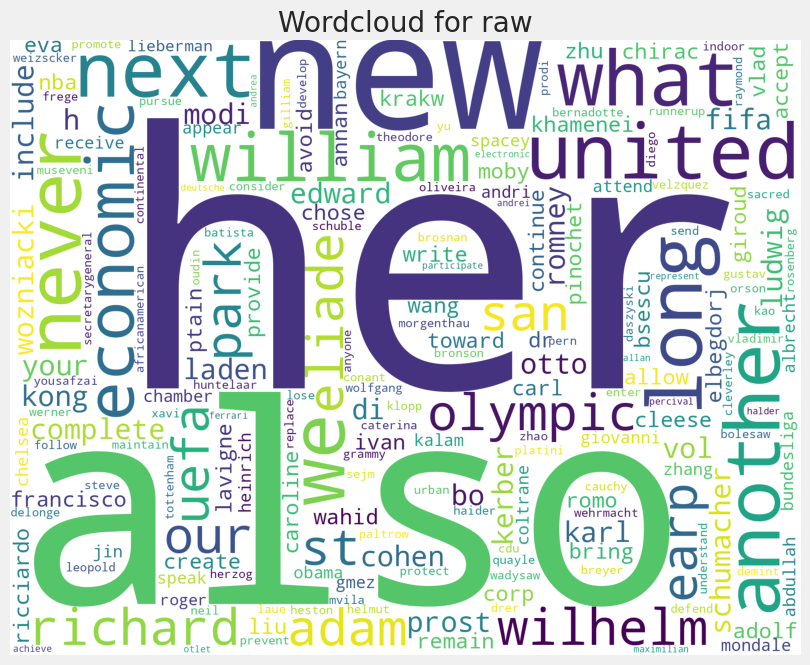

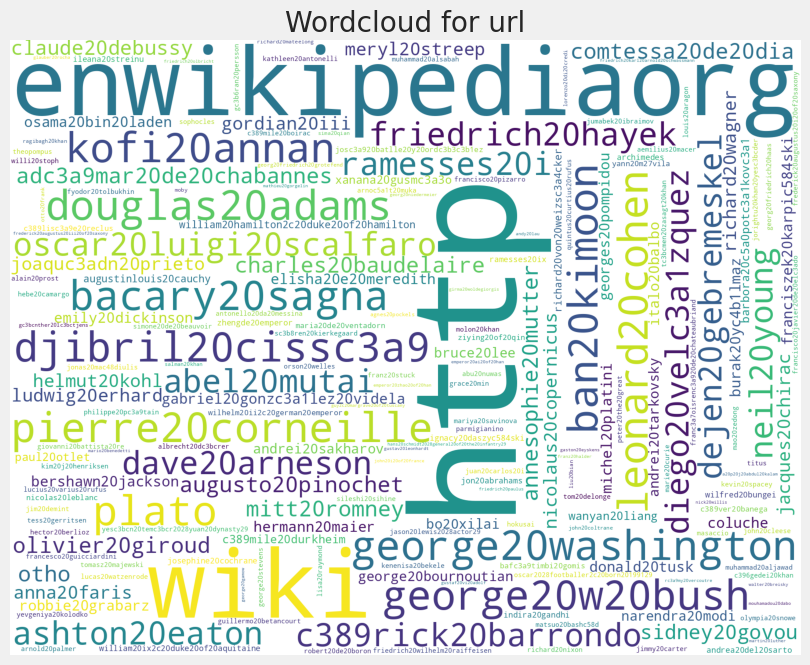

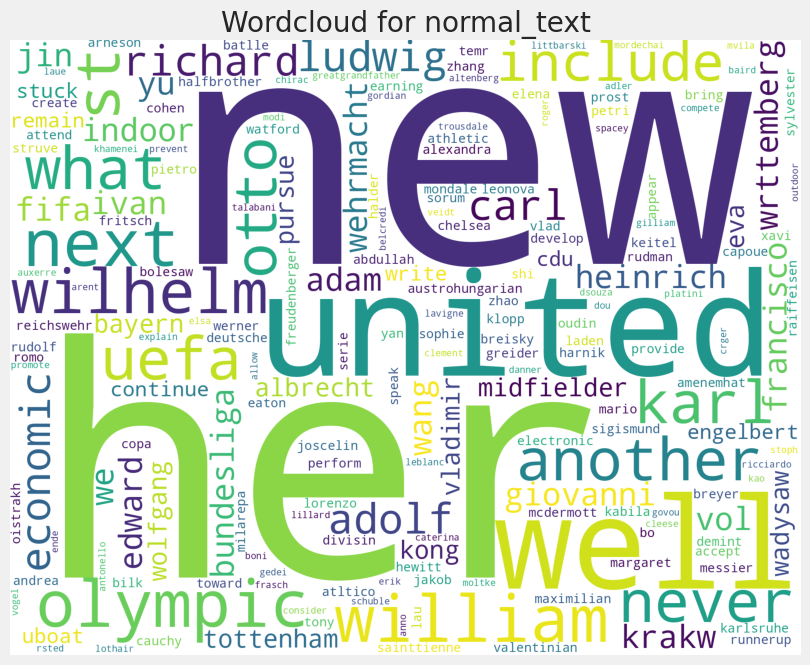

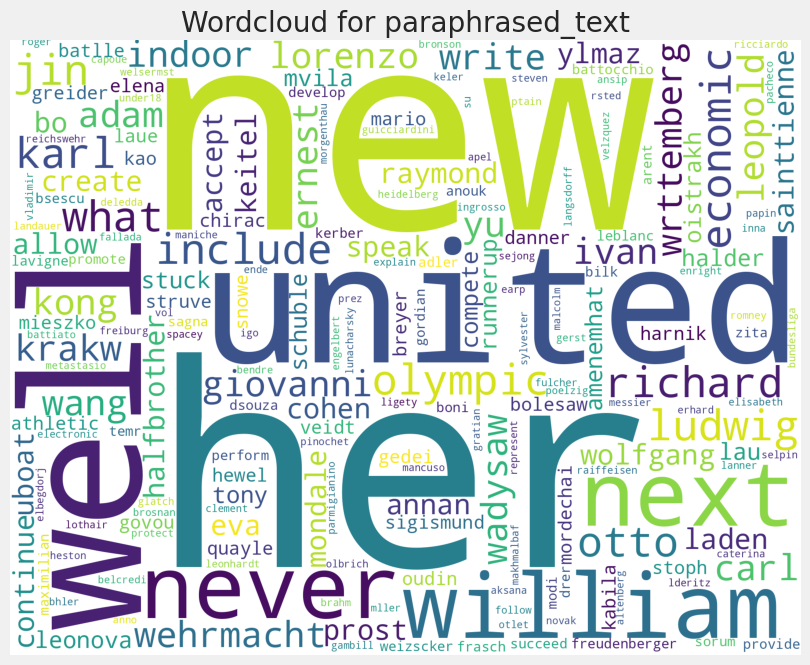

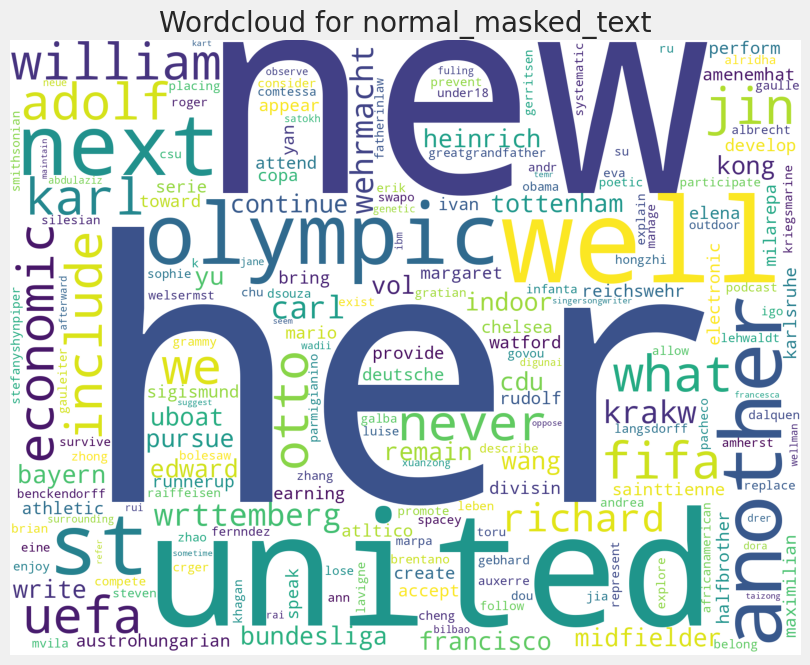

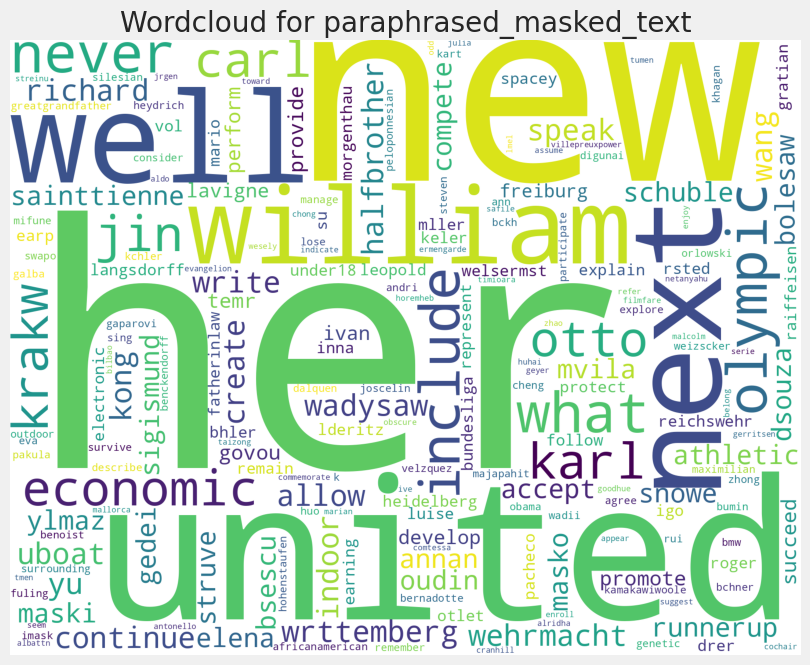

All Plots done
Time to run AutoViz = 81 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [20]:
%matplotlib inline
filename = ""
sep = ","
dft = AV.AutoViz(
    filename="",
    depVar="",
    dfte=df,
    header=0,
    verbose=0,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None
)